In [1]:
from anndata import read_h5ad
import pandas as pd
import numpy as np
import scvi
import scanpy as sc

%load_ext nb_black
use_cuda = True


In [2]:
import sys
data_path = "../../../TabulaSapiensData/"
ts_path = "../"
sys.path.append(ts_path)


In [3]:
import matplotlib.pyplot as plt

%matplotlib inline

In [4]:
adata = read_h5ad(data_path + "decontX/Pilot1_Pilot2.decontX.h5ad")

/data/yosef2/users/chenling/miniconda3/envs/scvi-tools/lib/python3.8/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):
/data/yosef2/users/chenling/miniconda3/envs/scvi-tools/lib/python3.8/site-packages/numba/np/ufunc/parallel.py:363: NumbaWarning: The TBB threading layer requires TBB version 2019.5 or later i.e., TBB_INTERFACE_VERSION >= 11005. Found TBB_INTERFACE_VERSION = 9002. The TBB threading layer is disabled.
  warnings.warn(problem)
/data/yosef2/users/chenling/miniconda3/envs/scvi-tools/lib/python3.8/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


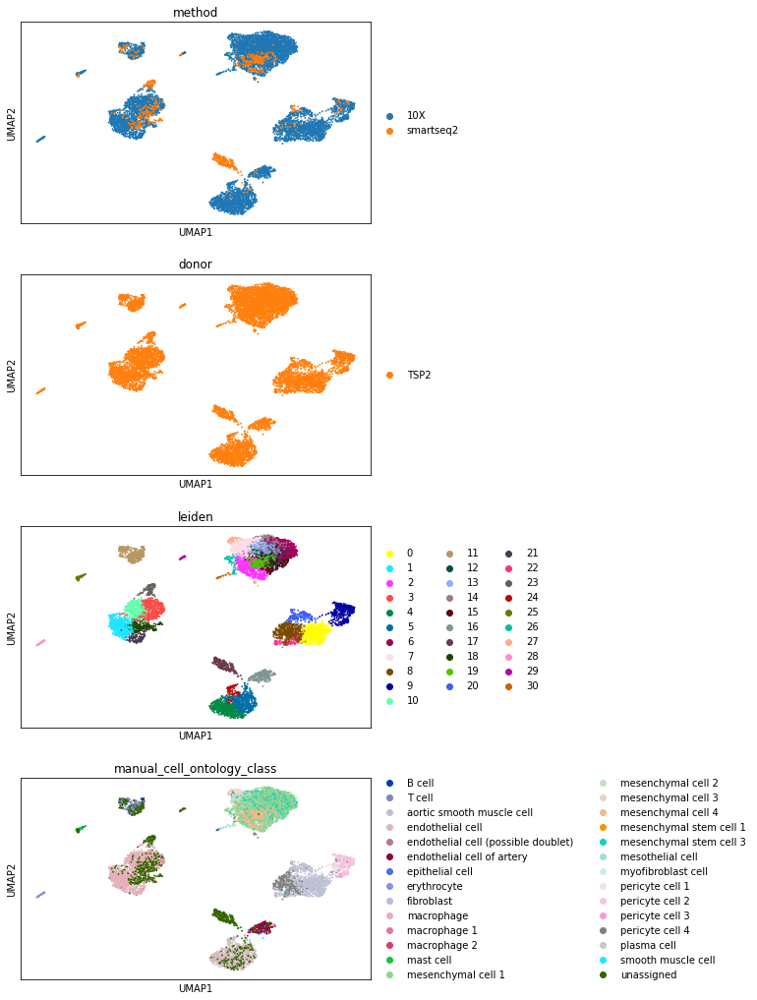

In [5]:
organ = "Vasculature"
organ_adata = adata[adata.obs["tissue"] == organ]
sc.pp.neighbors(organ_adata, use_rep="X_scvi_decontX")
sc.tl.umap(organ_adata)
organ_adata.obsm["X_umap_decontX"] = organ_adata.obsm["X_umap"].copy()
sc.tl.leiden(organ_adata, resolution=2)
sc.pl.umap(
    organ_adata,
    color=["method", "donor", "leiden", "manual_cell_ontology_class"],
    ncols=1,
)
organ_adata.X = np.log1p(organ_adata.X)

# cluster to celltype correspondance
count is a matrix of cluster-cell type correspondance, where each row is a celltype, and each colum is a cluster. The entries to the matrix is the number of cells that is annotated as celltype *X* and cluster *Y*

In [6]:
count = {}
for c in np.unique(organ_adata.obs["leiden"]):
    count[c] = {}
    for t in np.unique(organ_adata.obs["manual_cell_ontology_class"]):
        count[c][t] = np.sum(
            (organ_adata.obs["leiden"].astype(str) == c)
            & (organ_adata.obs["manual_cell_ontology_class"] == t)
        )

count = pd.DataFrame.from_dict(count)

We can visualize the cluster assignment of each cell type through this heatmap. The color is normalized for each celltype 

<AxesSubplot:>

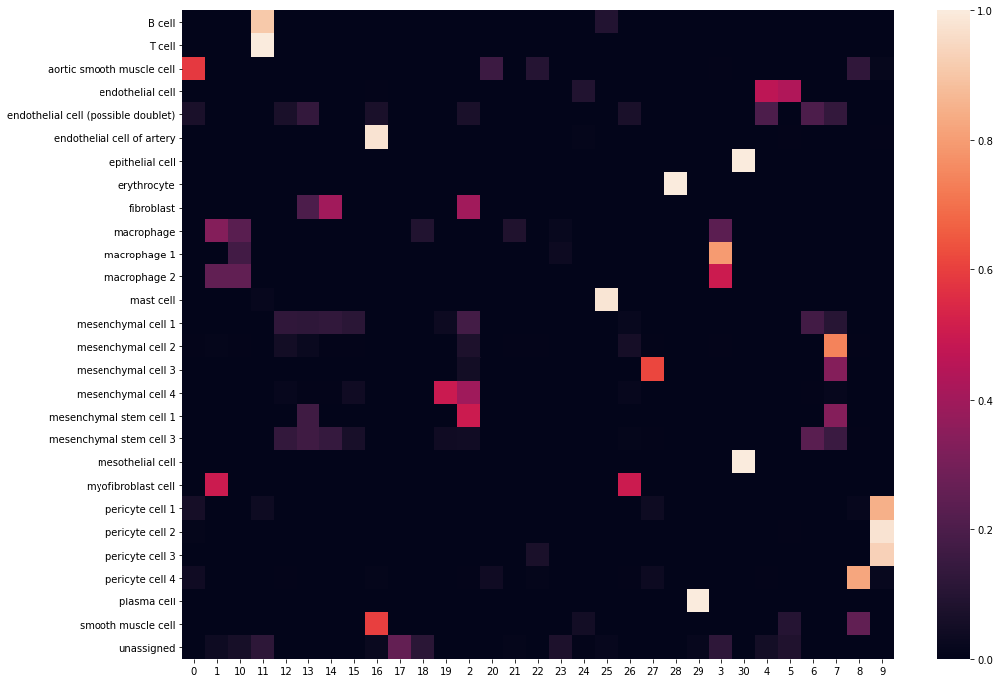

In [7]:
import seaborn

plt.figure(figsize=(16, 12))
seaborn.heatmap((count.T / count.sum(axis=1)).T)

# dictionary of cell type composition of each cluster 
What are clusters previously annotated as 

In [8]:
cluster_composition = {}
for x in count.columns.values:
    t = count.index[count[x] > 0].values
    freq = np.asarray([count.loc[y, x] for y in t]) / count[x].sum()
    res = [a + ": %.2f" % b for a, b in zip(t, freq)]
    cluster_composition[x] = res

In [9]:
cluster_composition["0"]

['aortic smooth muscle cell: 0.96',
 'endothelial cell (possible doublet): 0.00',
 'mesenchymal cell 1: 0.00',
 'mesenchymal cell 2: 0.00',
 'pericyte cell 1: 0.01',
 'pericyte cell 2: 0.01',
 'pericyte cell 4: 0.03']

# Reassign pure clusters
If a cluster is very pure (>95% of annotated cells come from the same celltype, we reassign the clusters to all have the same labels) 

In [10]:
def Purity(x):
    names = x.index
    x = np.asarray(x).ravel()
    x = x[names != "unassigned"]
    return (np.max(x) / np.sum(x), names[np.argmax(x)])

In [11]:
cluster_purity = count.apply(Purity, axis=0).T
confident_clusters = cluster_purity[cluster_purity[0] > 0.95].index

<ipython-input-1-963029a66ab7>:5: RuntimeWarning: invalid value encountered in long_scalars
  return (np.max(x) / np.sum(x), names[np.argmax(x)])


In [12]:
for i in confident_clusters:
    organ_adata.obs.loc[
        organ_adata.obs["leiden"] == i, "new_manual_cell_ontology_class"
    ] = cluster_purity.loc[i, 1]

/data/yosef2/users/chenling/miniconda3/envs/scvi-tools/lib/python3.8/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])
... storing 'new_manual_cell_ontology_class' as categorical


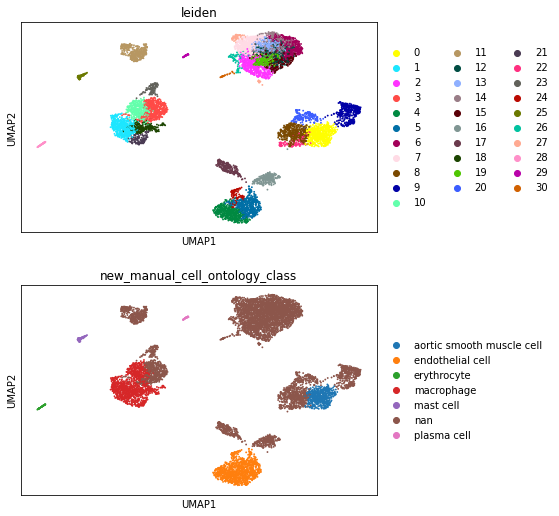

In [13]:
sc.pl.umap(
    organ_adata,
    color=["leiden", "new_manual_cell_ontology_class"],
    ncols=1,
)

In [14]:
organ_adata.obs.groupby(["leiden"]).agg(
    {"new_manual_cell_ontology_class": set, "Propagated.Annotation": set}
)

,new_manual_cell_ontology_class,Propagated.Annotation
leiden,,
0,{aortic smooth muscle cell},"{pericyte cell 4, pericyte cell 1, aortic smoo..."
1,{macrophage},"{macrophage, macrophage 2, macrophage 1, cell}"
2,{nan},"{mesenchymal stem cell 3, mesenchymal cell 4, ..."
3,{nan},"{macrophage, macrophage 2, macrophage 1}"
4,{endothelial cell},{endothelial cell}
5,{endothelial cell},"{endothelial cell, smooth muscle cell, B cell,..."
6,{nan},"{mesenchymal stem cell 3, mesenchymal cell 4, ..."
7,{nan},"{mesenchymal stem cell 3, mesenchymal cell 4, ..."
8,{nan},"{pericyte cell 4, mesenchymal cell 3, aortic s..."


/data/yosef2/users/chenling/miniconda3/envs/scvi-tools/lib/python3.8/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


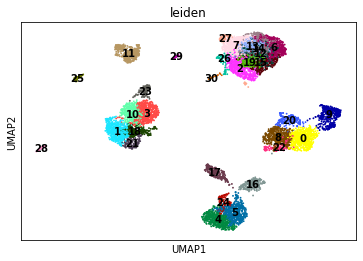

In [15]:
sc.pl.umap(organ_adata, color="leiden", legend_loc="on data")

# Sankey Diagram between cluster and compartment

In [16]:
from utils.colorDict import (
    donor_colors,
    method_colors,
    compartment_colors,
    tissue_colors,
)

In [17]:
from utils.plotting_utils import *
from utils.colorDict import compartment_colors

import plotly
import chart_studio.plotly as py
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot

import plotly.io as pio

pio.renderers.default = "notebook"

init_notebook_mode(connected=True)

In [18]:
df = pd.DataFrame(columns=["celltype", "compartment", "count"])
for t in np.unique(organ_adata.obs["manual_cell_ontology_class"]):
    for c in np.unique(organ_adata.obs["compartment_pred_svm"]):
        x = np.sum(
            (organ_adata.obs["compartment_pred_svm"].astype(str) == c)
            & (organ_adata.obs["manual_cell_ontology_class"] == t)
        )
        df = df.append(
            pd.DataFrame([t, c, x], index=["celltype", "compartment", "count"]).T,
            ignore_index=True,
        )


fig = genSankey(
    df,
    cat_cols_color=[compartment_colors(), "#00A1E0"],
    cat_cols=["compartment", "celltype"],
    value_cols="count",
    title="celltype-compartment",
)
iplot(fig, validate=False)
plotly.offline.plot(
    fig, validate=False, filename="figures/celltype_sankey_%s" % organ + ".html"
)  # , output_type='div')

'figures/celltype_sankey_Vasculature.html'

# visualize compartment markers

In [19]:
compartment_markers = {
    "Epithelial": ["CDH1", "CLDN4", "EPCAM"],
    "Endothelial": ["CA4", "CDH5", "CLDN5", "PECAM1", "VWF"],
    "Stromal": ["BGN", "DCN", "COL1A2"],
    "Immune": ["LCP1", "PTPRC", "RAC2"],
}

In [20]:
for x in compartment_markers.keys():
    sc.tl.score_genes(organ_adata, compartment_markers[x], score_name="%s_score" % x)

/data/yosef2/users/chenling/miniconda3/envs/scvi-tools/lib/python3.8/site-packages/anndata/_core/anndata.py:1094: FutureWarning:

is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead

/data/yosef2/users/chenling/miniconda3/envs/scvi-tools/lib/python3.8/site-packages/anndata/_core/anndata.py:1094: FutureWarning:

is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead

/data/yosef2/users/chenling/miniconda3/envs/scvi-tools/lib/python3.8/site-packages/anndata/_core/anndata.py:1094: FutureWarning:

is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead

/data/yosef2/users/chenling/miniconda3/envs/scvi-tools/lib/python3.8/site-packages/anndata/_core/anndata.py:1094: FutureWarning:

is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead



/data/yosef2/users/chenling/miniconda3/envs/scvi-tools/lib/python3.8/site-packages/anndata/_core/anndata.py:1192: FutureWarning:

is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead



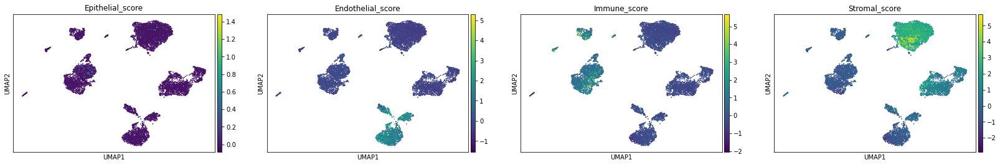

In [21]:
sc.pl.umap(
    organ_adata,
    color=["Epithelial_score", "Endothelial_score", "Immune_score", "Stromal_score"],
)

# Find markers for each cluster

In [22]:
sc.tl.rank_genes_groups(organ_adata, groupby="leiden", method="wilcoxon")

In [23]:
def FormatDE(res):
    groups = res['scores'].dtype.names
    df_res = {}
    for group in groups:
        df = pd.DataFrame([res['scores'][group],
                           res['logfoldchanges'][group],res['pvals_adj'][group]], 
                           columns=res['names'][group],
                           index=['wilcoxon_score','log fold change','adjusted pvalue'])
        df_res[group] = df
    return df_res


In [24]:
DE = FormatDE(organ_adata.uns["rank_genes_groups"])

### top positive marker genes

In [25]:
organ_cluster_genes = pd.DataFrame(organ_adata.uns['rank_genes_groups']['names'])
organ_cluster_genes.iloc[:20]


,0,1,2,3,4,5,6,7,8,9,...,21,22,23,24,25,26,27,28,29,30
0,RGS5,CCL3L1,C3,LYVE1,ACKR1,VWF,UAP1,SERPINF1,FN1,NOTCH3,...,CTSZ,ITGA8,C1QA,SLC9A3R2,TPSAB1,PLA2G2A,SCN7A,HBA2,MZB1,MSLN
1,TPM2,CCL3,FBLN1,MRC1,PLVAP,PLVAP,SCARA5,APOD,BGN,MYL9,...,FABP5,MYH11,C1QB,SOX18,TPSB2,FBLN1,CDH19,HBA1,DERL3,MUC16
2,MYL9,MSR1,LAMA2,VSIG4,RAMP3,ACKR1,ACKR3,SRPX,IGFBP2,ACTA2,...,LYZ,MYH10,FTL,CLDN5,CPA3,DCN,APOD,HBB,SPAG4,ITLN1
3,PLN,SLCO2B1,ABCA8,MS4A6A,ADGRL4,PECAM1,FBN1,C7,AEBP1,TINAGL1,...,CTSD,TPM2,FCER1G,PODXL,KIT,CCDC80,PTGDS,SLC25A37,FCRL5,BICDL1
4,PPP1R14A,HLA-DRA,CCDC80,RNASE1,NPDC1,RAMP3,ADAMTS5,SPOCK1,MGP,TAGLN,...,CAPG,CCN3,C1QC,ICAM2,CD69,CFD,ANGPTL7,SLC25A39,SEC11C,KRT19
5,ITGA8,LAPTM5,SFRP2,CD163,SOX18,ADGRL4,MFAP5,RARRES2,CDH13,MYLK,...,CTSS,FLNA,RNASE1,CLEC14A,RHEX,MFAP5,NDRG2,ALAS2,SSR4,KRT8
6,DSTN,CD83,C1R,C1QA,GIMAP7,GIMAP7,CYP4B1,COL6A3,DKK3,TPM2,...,TYROBP,RGS5,CD74,ADGRF5,IL1RL1,SERPINF1,GPC3,SNCA,TNFRSF17,KRT18
7,MYH11,FCGR2A,DCN,C1QC,PECAM1,EGFL7,DCN,PCOLCE,THBS2,NR2F2,...,SPI1,ACTA2,F13A1,IFI27,HPGDS,MGST1,EGFR,TRIM58,CYBA,HP
8,ACTA2,CCL4,SERPINF1,F13A1,ECSCR,SOX18,SMIM14,PRRX1,LTBP1,AP002956.1,...,LAPTM5,ITGA1,GPX1,TM4SF1,RGS2,GPX3,COL9A3,DCAF12,ISG20,RARRES1
9,TAGLN,MS4A7,GPX3,C1QB,LIFR,CAVIN2,FSTL1,EPHX1,TNFRSF11B,CSRP2,...,CSTB,COL18A1,TYROBP,CAV1,ALOX5AP,IGFBP6,CLDN1,GYPC,FKBP11,UPK3B


In [26]:
for x in DE.keys():
    print(x)
    display(DE[x].T[:20])

0


,wilcoxon_score,log fold change,adjusted pvalue
RGS5,38.439682,6.819854,0.000000e+00
TPM2,38.407406,7.159810,0.000000e+00
MYL9,38.263199,5.672627,0.000000e+00
PLN,38.185394,6.293163,0.000000e+00
PPP1R14A,38.024776,6.078887,0.000000e+00
ITGA8,38.024376,5.788856,0.000000e+00
DSTN,37.856880,4.431964,0.000000e+00
MYH11,37.831596,6.032035,0.000000e+00
ACTA2,37.539429,7.267881,1.370983e-304
TAGLN,37.246174,6.180031,7.194120e-300


1


,wilcoxon_score,log fold change,adjusted pvalue
CCL3L1,34.008854,6.428729,8.812412e-249
CCL3,33.991314,6.465043,8.812412e-249
MSR1,33.443878,4.805943,6.199286e-241
SLCO2B1,33.233883,4.779042,5.135895e-238
HLA-DRA,33.147331,5.053557,7.285136e-237
LAPTM5,33.070835,4.758156,7.660262e-236
CD83,33.053051,4.840654,1.182715e-235
FCGR2A,32.931263,4.675051,5.774058e-234
CCL4,32.684956,6.225708,1.671408e-230
MS4A7,32.335136,4.548695,1.321362e-225


2


,wilcoxon_score,log fold change,adjusted pvalue
C3,25.691736,4.009502,8.511711e-141
FBLN1,24.011204,4.131009,6.252097e-123
LAMA2,23.837814,2.704870,2.658433e-121
ABCA8,23.003946,2.685953,6.263929e-113
CCDC80,22.936285,3.216324,2.377804e-112
SFRP2,22.665590,3.121022,9.608185e-110
C1R,22.545815,3.244703,1.241341e-108
DCN,22.466145,5.281058,6.548561e-108
SERPINF1,22.129890,3.407221,1.066040e-104
GPX3,21.897154,3.340368,1.627875e-102


3


,wilcoxon_score,log fold change,adjusted pvalue
LYVE1,34.033096,6.386632,4.250264e-249
MRC1,32.677658,5.112957,9.548453e-230
VSIG4,32.515129,5.409282,1.278991e-227
MS4A6A,32.380135,5.096485,7.691806e-226
RNASE1,32.166042,5.725581,6.204884e-223
CD163,32.090130,5.648691,5.939915e-222
C1QA,31.673094,5.905060,3.067494e-216
C1QC,31.499411,5.270890,6.511891e-214
F13A1,31.163160,5.291296,2.200716e-209
C1QB,31.144175,5.680927,3.580659e-209


4


,wilcoxon_score,log fold change,adjusted pvalue
ACKR1,35.906746,7.069142,1.411219e-277
PLVAP,34.503811,5.712018,2.069891e-256
RAMP3,34.211330,5.536565,3.219198e-252
ADGRL4,33.617321,5.259241,1.378736e-243
NPDC1,33.207184,3.909289,9.983804e-238
SOX18,33.091393,5.215137,3.877770e-236
GIMAP7,32.837269,4.419134,1.455844e-232
PECAM1,32.782211,4.541710,7.768733e-232
ECSCR,32.636890,4.965192,8.044182e-230
LIFR,32.611294,4.768044,1.670056e-229


5


,wilcoxon_score,log fold change,adjusted pvalue
VWF,31.933279,4.948438,5.428309e-219
PLVAP,31.234274,4.517269,7.163951e-210
ACKR1,30.247259,5.170176,8.342933e-197
PECAM1,29.600395,3.711660,1.738898e-188
RAMP3,29.358109,4.150687,1.847422e-185
ADGRL4,28.492500,3.973614,1.067719e-174
GIMAP7,28.204163,3.546600,3.299343e-171
EGFL7,28.201504,3.365654,3.299343e-171
SOX18,28.157078,3.922583,1.050523e-170
CAVIN2,28.079906,3.587560,8.456618e-170


6


,wilcoxon_score,log fold change,adjusted pvalue
UAP1,31.170631,3.653254,1.568863e-208
SCARA5,30.648937,4.041931,8.036699e-202
ACKR3,30.038260,3.791337,6.098806e-194
FBN1,29.923845,3.847811,1.418099e-192
ADAMTS5,29.908632,4.009627,1.789282e-192
MFAP5,29.758556,4.608696,1.318679e-190
CYP4B1,29.070892,3.422833,7.046927e-182
DCN,28.463545,5.700821,2.437894e-174
SMIM14,28.275932,2.504131,4.469604e-172
FSTL1,28.235598,3.335227,1.259142e-171


7


,wilcoxon_score,log fold change,adjusted pvalue
SERPINF1,28.901339,3.946229,3.525733e-179
APOD,28.899887,5.019849,3.525733e-179
SRPX,28.464830,3.409231,6.266875e-174
C7,28.126284,4.576800,6.879623e-170
SPOCK1,27.784630,3.187584,7.833490e-166
RARRES2,27.193632,3.060389,7.579224e-159
COL6A3,26.570847,3.173885,1.240547e-151
PCOLCE,26.516304,2.739367,4.626592e-151
PRRX1,26.266768,2.818752,3.008333e-148
EPHX1,26.260185,2.421150,3.219275e-148


8


,wilcoxon_score,log fold change,adjusted pvalue
FN1,31.997860,5.285243,6.874528e-220
BGN,31.389967,4.384531,8.163490e-212
IGFBP2,31.299736,5.327805,9.232660e-211
AEBP1,30.708691,4.218097,6.413090e-203
MGP,29.861570,5.382622,7.314098e-192
CDH13,29.654305,4.853034,2.928445e-189
DKK3,29.637686,4.612010,4.110542e-189
THBS2,29.491758,4.222845,2.702232e-187
LTBP1,29.238144,3.666886,4.155941e-184
TNFRSF11B,28.881683,5.277815,1.193900e-179


9


,wilcoxon_score,log fold change,adjusted pvalue
NOTCH3,29.841661,4.632340,6.630105e-191
MYL9,28.118055,4.379756,1.734753e-169
ACTA2,27.509344,5.888718,2.663402e-162
TINAGL1,27.084633,3.633561,1.758959e-157
TAGLN,26.699816,4.959638,4.641058e-153
MYLK,26.296783,4.113513,1.755352e-148
TPM2,26.278223,4.697363,2.503671e-148
NR2F2,26.046938,3.259451,9.531604e-146
AP002956.1,25.768696,3.869956,1.171493e-142
CSRP2,25.502695,4.237850,9.848024e-140


10


,wilcoxon_score,log fold change,adjusted pvalue
LYVE1,30.465130,5.755500,4.446081e-199
MRC1,28.934586,4.700759,1.291164e-179
S100A9,28.622757,5.078876,5.356527e-176
VSIG4,28.621401,4.663503,5.356527e-176
MS4A6A,28.338694,4.368639,1.358325e-172
C1QA,27.873884,5.432519,5.428093e-167
C1orf162,27.625673,3.974686,4.601543e-164
CD163,27.519186,5.091790,7.615928e-163
MAF,27.500029,3.527573,1.042860e-162
VAMP8,27.499674,3.648867,1.042860e-162


11


,wilcoxon_score,log fold change,adjusted pvalue
CXCR4,30.863110,6.343555,1.099794e-204
CD69,28.369242,7.155462,5.706384e-173
CCL5,25.077295,8.136795,2.589904e-135
DUSP2,24.886690,4.408511,2.653891e-133
IL32,24.833920,5.559165,9.463620e-133
GZMA,24.185410,10.462835,5.828873e-126
HCST,23.483994,3.572904,8.749038e-119
CD52,23.475878,6.048831,1.008512e-118
CYTIP,23.189493,4.505906,7.438508e-116
BTG1,22.774483,2.189214,9.295147e-112


12


,wilcoxon_score,log fold change,adjusted pvalue
FBLN1,23.347790,4.187745,8.543610e-116
ABI3BP,23.111643,2.982074,1.040852e-113
GAS1,22.992311,3.530042,1.091970e-112
DCN,22.612633,5.406116,4.791051e-109
IGF1,22.531849,4.013029,2.382307e-108
GALNT15,21.831301,2.621392,1.148366e-101
SFRP2,21.552099,3.410603,4.255389e-99
HELLPAR,21.525082,3.321603,6.671388e-99
CYBRD1,21.328484,2.251140,4.041029e-97
LAMA2,21.276136,2.473722,1.111944e-96


13


,wilcoxon_score,log fold change,adjusted pvalue
FBLN1,25.052389,4.534091,9.679594e-134
SFRP2,24.012714,3.959164,6.029058e-123
GAS1,23.853443,3.738137,1.830205e-121
DCN,23.662304,5.576066,1.297805e-119
SCARA5,23.333250,3.490723,2.400681e-116
C1R,23.253204,3.309485,1.295334e-115
GSN,23.226570,2.948281,2.064218e-115
PODN,23.179623,3.108789,5.379343e-115
IGFBP6,23.008547,4.249453,2.503813e-113
CCDC80,22.934383,3.845252,1.242026e-112


14


,wilcoxon_score,log fold change,adjusted pvalue
MFAP5,23.507706,4.217650,2.002686e-117
MGST1,23.034126,3.498620,6.245824e-113
CFD,22.886887,4.713500,1.231682e-111
ACKR3,22.439714,3.158816,2.373547e-107
OLFML3,22.388428,2.792585,6.008018e-107
PLA2G2A,22.363064,4.654197,8.841359e-107
SLPI,22.084641,3.632433,3.734560e-104
DCN,21.865208,5.272962,4.099681e-102
PDGFRL,21.767973,2.760112,3.053518e-101
SCARA5,21.715101,3.196482,8.695959e-101


15


,wilcoxon_score,log fold change,adjusted pvalue
FBN1,22.029860,3.716644,8.773557e-103
MFAP5,19.902313,4.103232,1.143751e-83
CD248,19.217163,2.760170,5.218157e-78
CCDC80,19.166365,3.564279,9.103515e-78
SLPI,19.156328,3.500918,9.103515e-78
TNXB,19.152201,2.565993,9.103515e-78
ADAMTS5,19.042444,3.205964,5.950679e-77
FSTL1,19.039125,2.937727,5.950679e-77
CYP4B1,18.922094,2.774895,4.906803e-76
ACKR3,18.598719,2.810308,1.937283e-73


16


,wilcoxon_score,log fold change,adjusted pvalue
MPZL2,24.332867,6.197028,5.182541e-126
CLEC14A,23.182800,4.978197,1.998614e-114
PTPRB,23.162792,5.095507,2.120169e-114
HYAL2,22.784449,4.891965,9.625444e-111
VWF,22.712477,5.578886,3.971255e-110
BMX,22.495918,6.337608,4.465017e-108
SLC9A3R2,22.406630,4.556537,2.852351e-107
ECSCR,22.163603,4.499529,5.675600e-105
HSPG2,21.801905,3.388181,1.455780e-101
PECAM1,21.719036,4.288119,7.982377e-101


17


,wilcoxon_score,log fold change,adjusted pvalue
FP671120.5,24.767496,7.809849,5.631636e-132
S1PR1,24.680862,8.121502,4.042769e-131
MT-RNR2,24.047192,4.455646,9.389724e-125
AQP1,22.791508,6.802982,4.201356e-112
EPAS1,22.527252,7.101790,1.554558e-109
CD74,21.678478,6.402021,1.909083e-101
MTRNR2L8,19.321604,6.571616,1.149734e-80
MTRNR2L12,18.934826,5.441065,1.769413e-77
PECAM1,18.706894,4.149380,1.225298e-75
LIMS2,18.453938,5.910227,1.268480e-73


18


,wilcoxon_score,log fold change,adjusted pvalue
GPR183,22.674725,6.239310,4.684677e-109
PLAUR,22.609140,5.458521,1.037110e-108
TNFAIP3,22.280985,5.358648,1.108751e-105
IL1B,22.028456,7.375851,2.262441e-103
CD83,21.979706,5.184474,5.302703e-103
LYZ,21.852909,5.686207,7.156215e-102
NLRP3,21.369234,6.130955,2.172598e-97
CXCL8,21.307930,6.433045,7.052545e-97
BCL2A1,21.293077,6.277842,8.608023e-97
SRGN,20.895412,4.401652,3.470058e-93


19


,wilcoxon_score,log fold change,adjusted pvalue
MMP2,19.960093,6.002433,7.210665e-84
MFAP5,19.841089,6.648110,3.872973e-83
PLA2G2A,19.519066,7.744632,1.483667e-80
FSTL1,19.430019,5.752641,6.331520e-80
CFD,19.391876,6.596920,1.064114e-79
SCARA5,19.322824,5.619479,3.387304e-79
DCN,19.209410,8.306249,2.596615e-78
FBN1,19.185879,5.154188,3.573811e-78
MGST1,19.150173,6.232433,6.309991e-78
IGFBP6,19.052704,6.869567,3.673125e-77


20


,wilcoxon_score,log fold change,adjusted pvalue
TPM2,17.006678,4.867330,2.875875e-61
PPP1R14A,16.038435,3.846798,1.689299e-54
TAGLN,15.630243,4.191501,7.844739e-52
ACTA2,15.297764,4.068581,1.194443e-49
MYL9,15.253985,3.103043,2.170946e-49
IGFBP2,15.080363,3.364506,2.917623e-48
DSTN,13.303068,2.212900,1.406313e-37
RGS5,13.156694,3.368577,8.569274e-37
C12orf75,12.615177,2.957989,7.429765e-34
MYH11,12.409622,2.815519,9.344317e-33


21


,wilcoxon_score,log fold change,adjusted pvalue
CTSZ,17.802465,4.598685,3.981079e-66
FABP5,17.622561,5.883593,4.867015e-65
LYZ,17.551950,5.504428,1.061802e-64
CTSD,17.539032,4.917887,1.061802e-64
CAPG,17.413229,5.578164,7.710076e-64
CTSS,17.318438,5.088120,3.350778e-63
TYROBP,17.279770,5.320362,5.619044e-63
SPI1,17.173626,4.564572,3.079231e-62
LAPTM5,17.153263,5.022258,3.886751e-62
CSTB,17.099514,4.169437,8.809833e-62


22


,wilcoxon_score,log fold change,adjusted pvalue
ITGA8,14.212174,4.317922,2.266395e-41
MYH11,14.179331,4.408215,2.413955e-41
MYH10,12.920466,3.464811,1.562521e-34
TPM2,12.511786,4.014503,1.521871e-32
CCN3,12.504522,3.533993,1.596794e-32
FLNA,12.371339,2.903066,6.467807e-32
RGS5,12.284517,3.865688,1.745375e-31
ACTA2,12.146886,4.228010,8.770504e-31
ITGA1,12.098561,2.708981,1.438006e-30
COL18A1,11.865252,2.808239,1.992262e-29


23


,wilcoxon_score,log fold change,adjusted pvalue
C1QA,14.705157,6.513341,8.791038e-45
C1QB,14.502992,6.396898,1.365581e-43
FTL,13.704028,4.190166,5.140162e-39
FCER1G,13.681994,5.435907,6.381294e-39
C1QC,13.619856,5.504300,1.381956e-38
RNASE1,13.209708,6.128983,2.837642e-36
CD74,12.714491,5.587182,1.205119e-33
F13A1,12.697122,5.290365,1.374731e-33
GPX1,12.467223,3.910429,1.792899e-32
TYROBP,12.451415,4.543154,2.073834e-32


24


,wilcoxon_score,log fold change,adjusted pvalue
SLC9A3R2,15.560061,4.967861,8.004439e-50
SOX18,15.283210,5.276932,2.912445e-48
CLDN5,15.050400,6.002859,6.518007e-47
PODXL,15.033514,4.740692,6.518007e-47
ICAM2,15.005439,4.896311,7.964170e-47
CLEC14A,14.879049,4.628153,4.423677e-46
ADGRF5,14.627741,4.853832,1.571745e-44
IFI27,14.585475,4.315984,2.557126e-44
TM4SF1,14.014681,4.280652,8.291932e-41
CAV1,13.998367,3.885297,9.389400e-41


25


,wilcoxon_score,log fold change,adjusted pvalue
TPSAB1,14.835155,17.564932,1.514719e-45
TPSB2,14.834203,16.439638,1.514719e-45
CPA3,14.834066,14.420592,1.514719e-45
KIT,14.823722,11.364124,1.514719e-45
CD69,14.439584,7.769935,3.433271e-43
RHEX,14.043082,14.571943,8.333700e-41
IL1RL1,13.878166,7.979306,7.225355e-40
HPGDS,13.074887,6.359666,2.997422e-35
RGS2,12.903710,5.190243,2.525152e-34
ALOX5AP,12.647921,4.677485,6.147922e-33


26


,wilcoxon_score,log fold change,adjusted pvalue
PLA2G2A,6.853175,2.816519,2.214631e-09
FBLN1,6.265717,2.365264,7.515958e-08
DCN,6.136289,3.507022,1.554009e-07
CCDC80,5.779221,1.670092,1.059483e-06
CFD,5.563379,2.466743,3.159644e-06
MFAP5,5.516303,1.939083,3.949820e-06
SERPINF1,5.370576,1.740547,7.899267e-06
MGST1,5.141937,1.402982,2.309947e-05
GPX3,4.930985,1.469145,5.873782e-05
IGFBP6,4.892449,2.013827,6.921840e-05


27


,wilcoxon_score,log fold change,adjusted pvalue
SCN7A,9.794834,8.989246,6.975632e-18
CDH19,9.349632,9.886257,2.588905e-16
APOD,9.236337,6.670566,5.005554e-16
PTGDS,8.642542,5.565008,6.472869e-14
ANGPTL7,8.494577,7.307469,1.949130e-13
NDRG2,8.214767,2.707811,1.564309e-12
GPC3,7.947331,3.958297,1.197751e-11
EGFR,7.249556,2.777486,1.785659e-09
COL9A3,7.169150,6.188638,2.961742e-09
CLDN1,7.108028,5.271447,3.849858e-09


28


,wilcoxon_score,log fold change,adjusted pvalue
HBA2,12.919421,15.300357,6.877639e-34
HBA1,12.919421,19.413643,6.877639e-34
HBB,12.919263,20.943163,6.877639e-34
SLC25A37,12.412533,4.870707,6.549760e-32
SLC25A39,12.013631,4.376475,2.111736e-30
ALAS2,11.991326,12.918966,2.669701e-30
SNCA,11.007799,5.408343,1.206530e-25
TRIM58,10.727681,7.162294,2.255178e-24
DCAF12,10.654748,3.713011,4.758217e-24
GYPC,10.409605,2.748340,5.762303e-23


29


,wilcoxon_score,log fold change,adjusted pvalue
MZB1,10.366876,13.730753,1.036876e-20
DERL3,10.366481,12.422730,1.036876e-20
SPAG4,10.064470,10.099027,1.556387e-19
FCRL5,9.792319,13.707551,1.787841e-18
SEC11C,9.621353,5.679416,7.287920e-18
SSR4,9.607574,5.149734,7.287920e-18
TNFRSF17,9.506027,16.866568,1.337694e-17
CYBA,9.502871,4.568071,1.337694e-17
ISG20,9.419870,6.099984,2.658840e-17
FKBP11,9.332924,5.745687,5.511829e-17


30


,wilcoxon_score,log fold change,adjusted pvalue
MSLN,8.817966,13.460037,1.692488e-14
MUC16,8.816225,13.870485,1.692488e-14
ITLN1,8.798629,12.934875,1.692488e-14
BICDL1,8.797314,9.387515,1.692488e-14
KRT19,8.794452,10.489532,1.692488e-14
KRT8,8.750791,8.098109,2.078738e-14
KRT18,8.715365,8.257226,2.437397e-14
HP,8.692394,9.007099,2.611477e-14
RARRES1,8.575176,7.031289,6.471443e-14
UPK3B,8.470296,10.368794,1.440967e-13


### for cluster 0 plot the top marker genes

/data/yosef2/users/chenling/miniconda3/envs/scvi-tools/lib/python3.8/site-packages/anndata/_core/anndata.py:1192: FutureWarning:

is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead



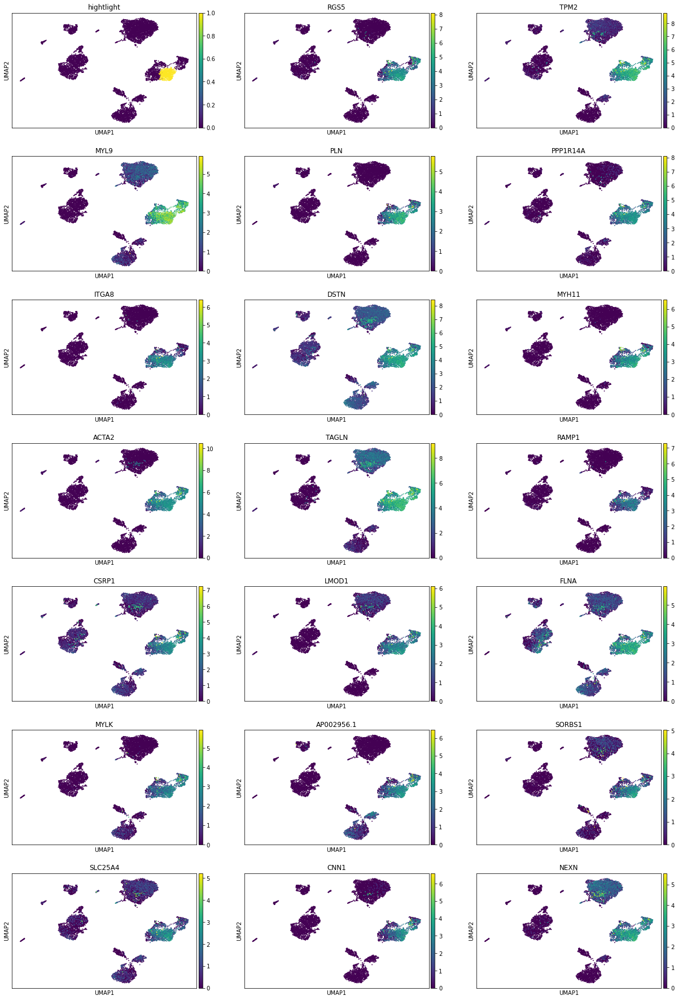

In [27]:
topgenes = list(DE["0"].T[:20].index)
organ_adata.obs["hightlight"] = organ_adata.obs["leiden"] == "0"
sc.pl.umap(
    organ_adata,
    color=["hightlight"] + topgenes,
    ncols=3,
)

You can do this for other clusters as well. Here I plot the top 5 genes for all other clusters

0


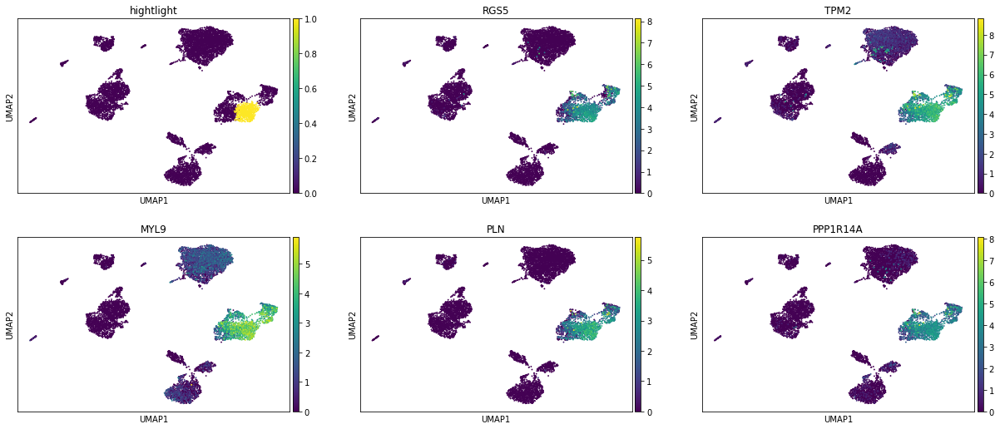

1


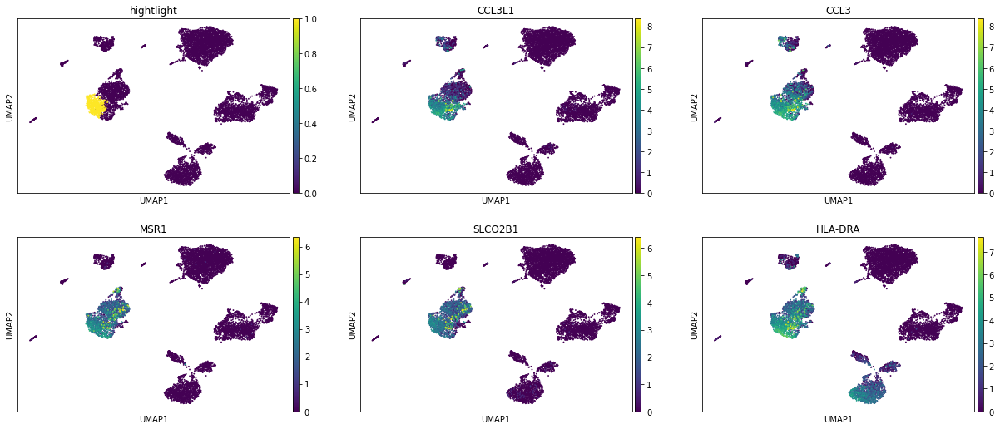

2


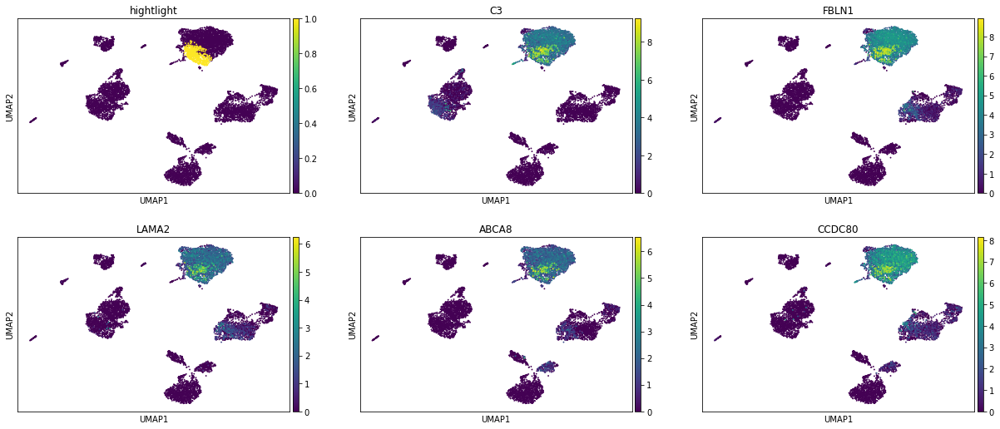

3


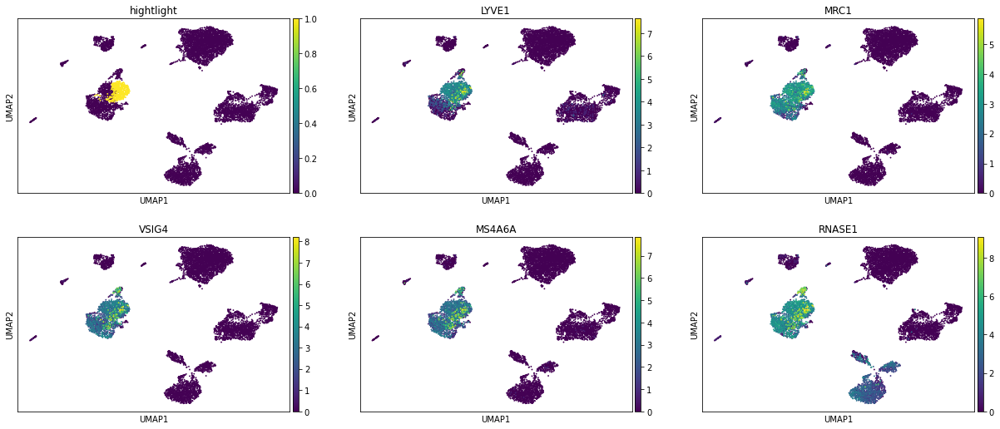

4


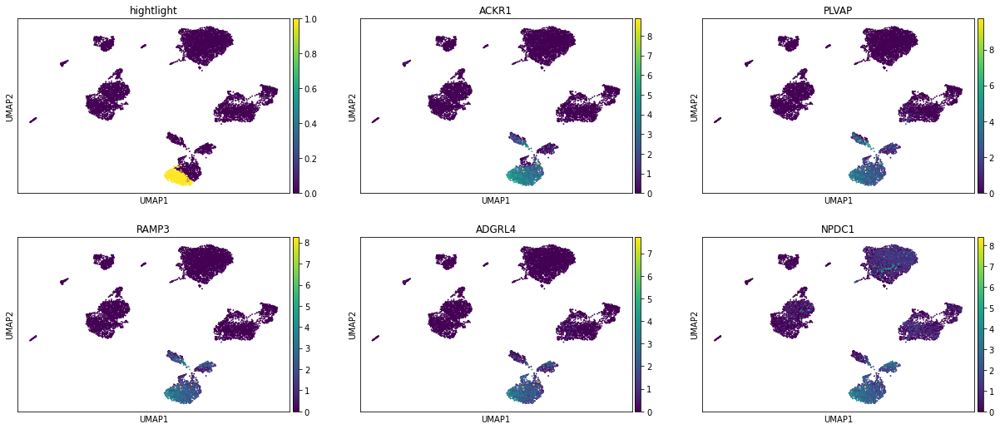

5


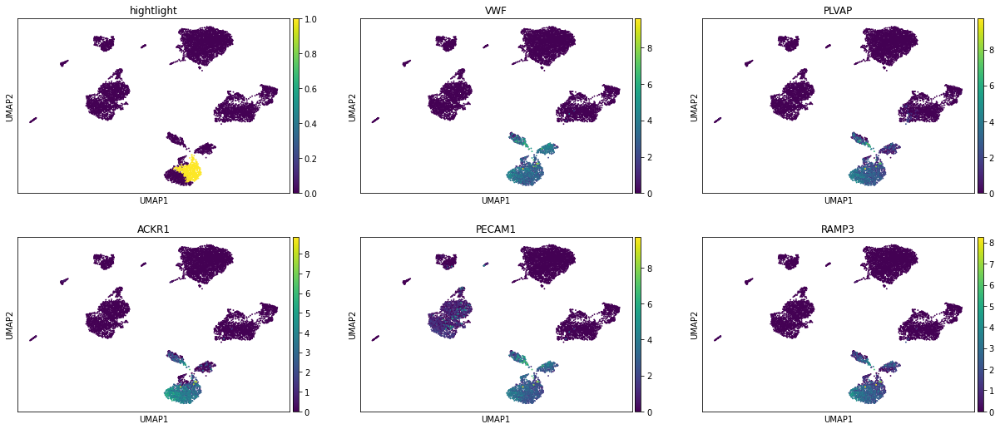

6


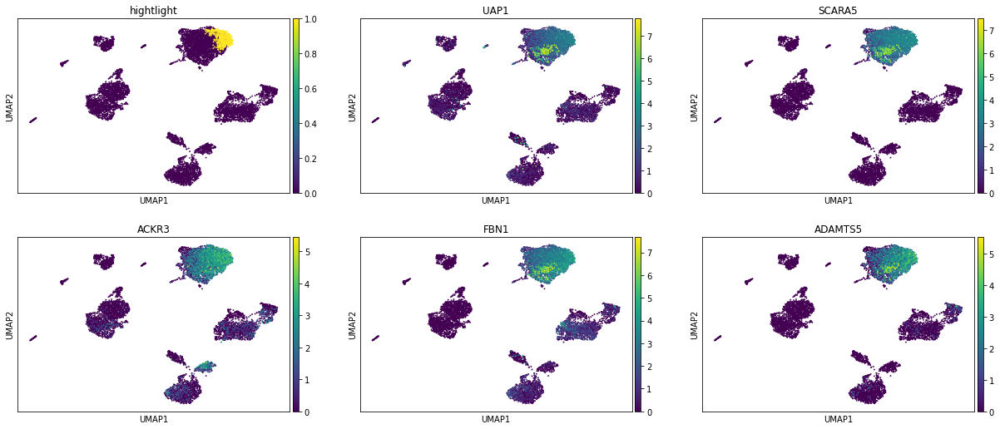

7


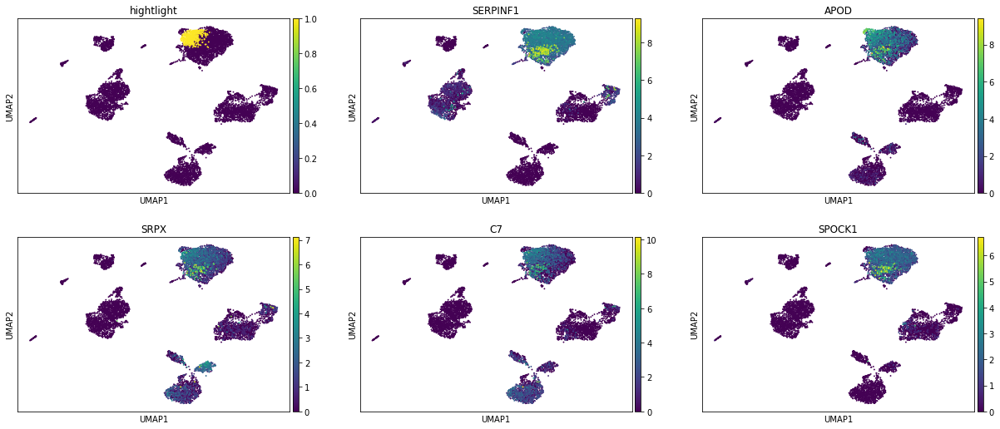

8


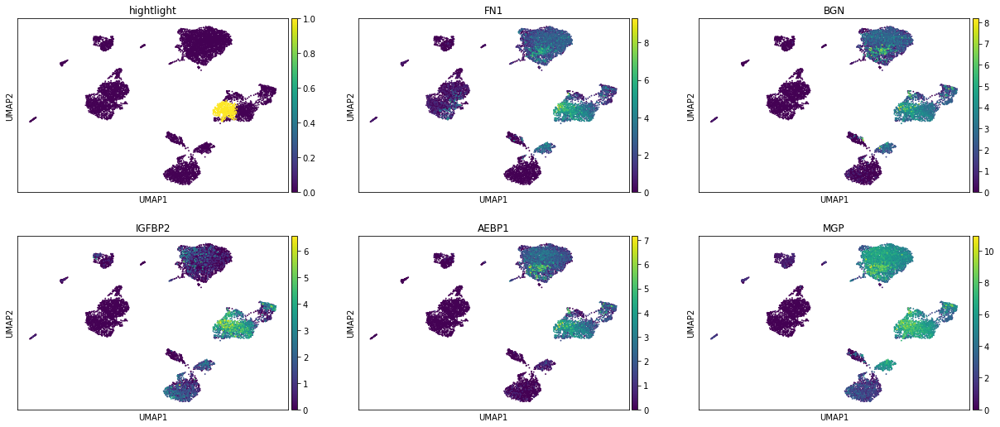

9


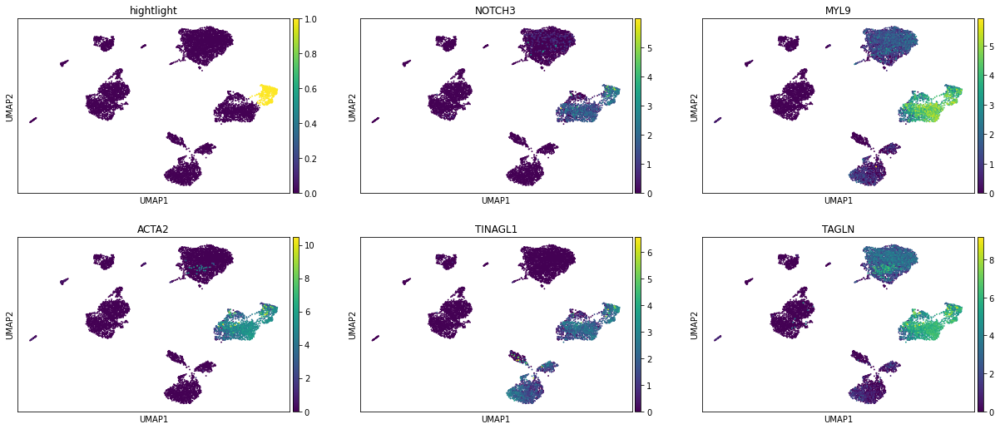

10


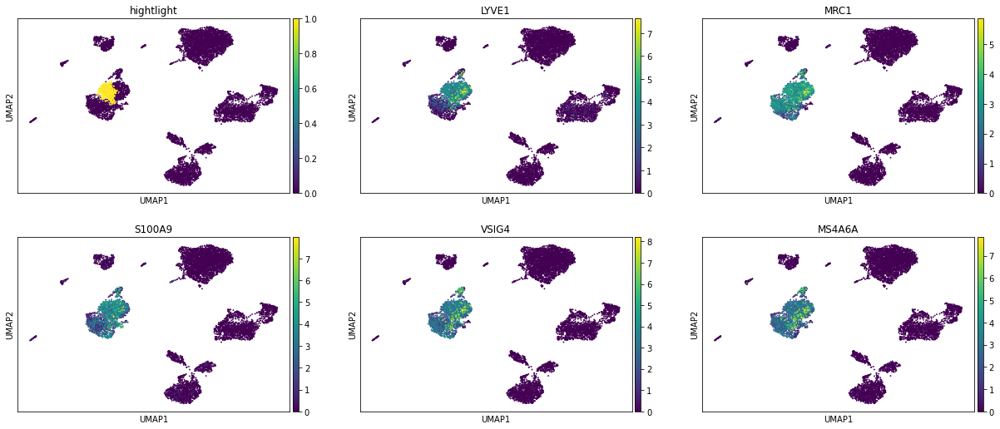

11


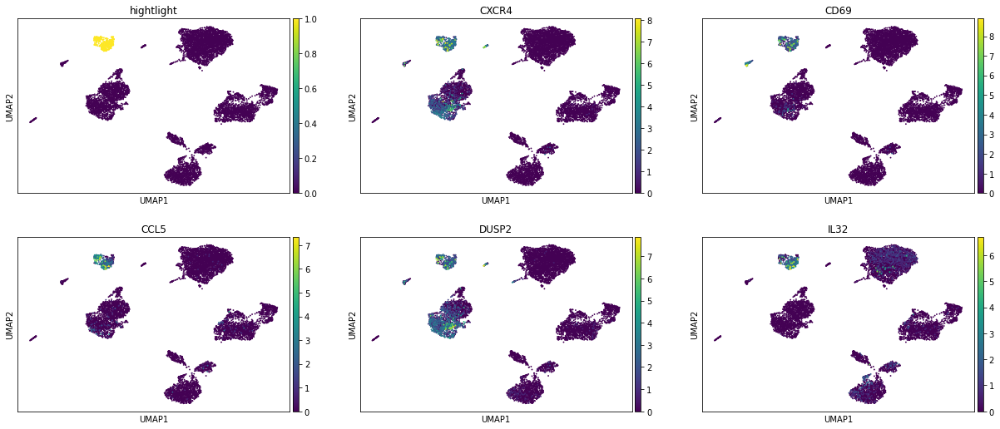

12


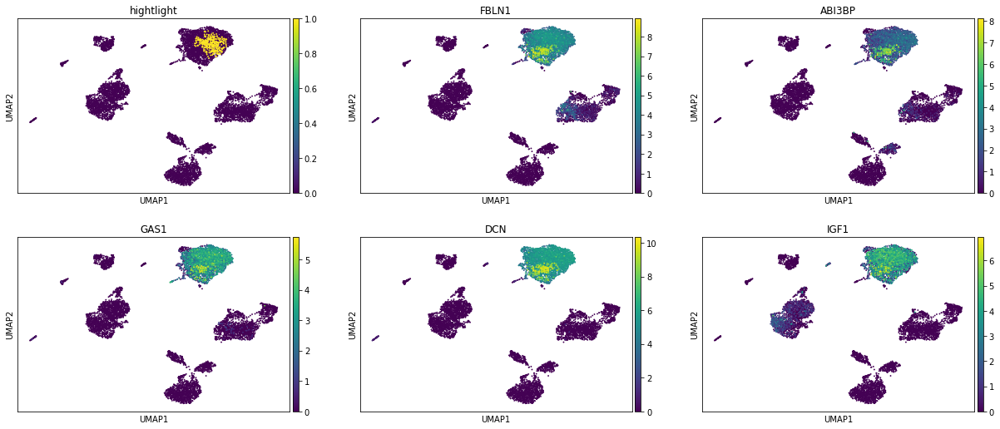

13


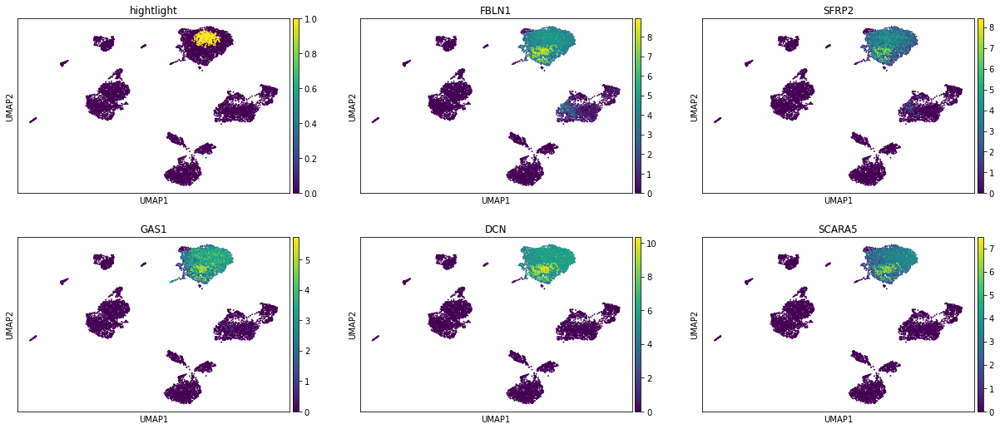

14


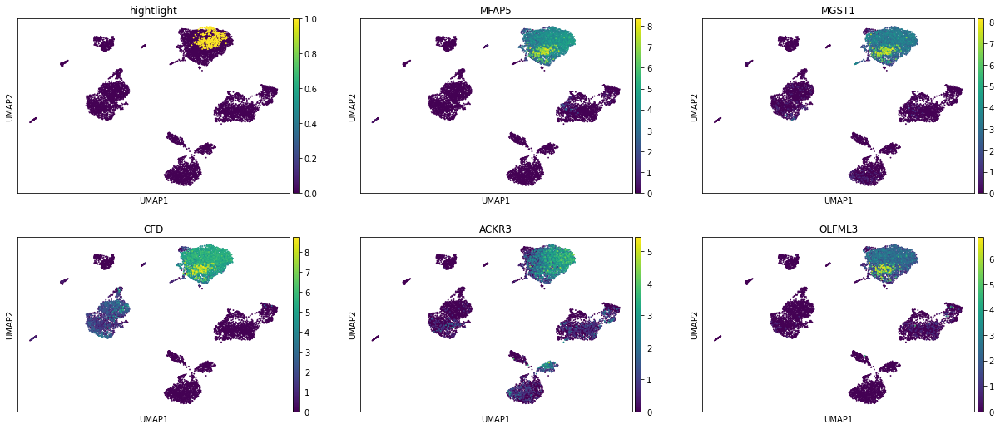

15


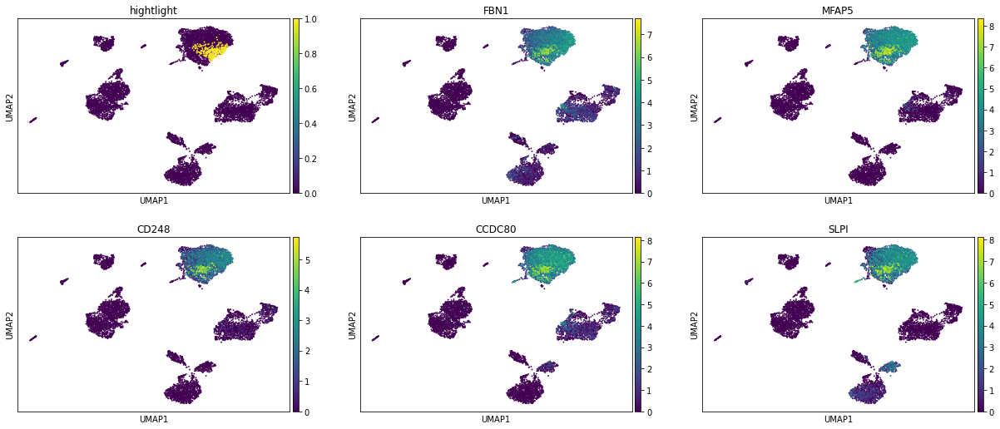

16


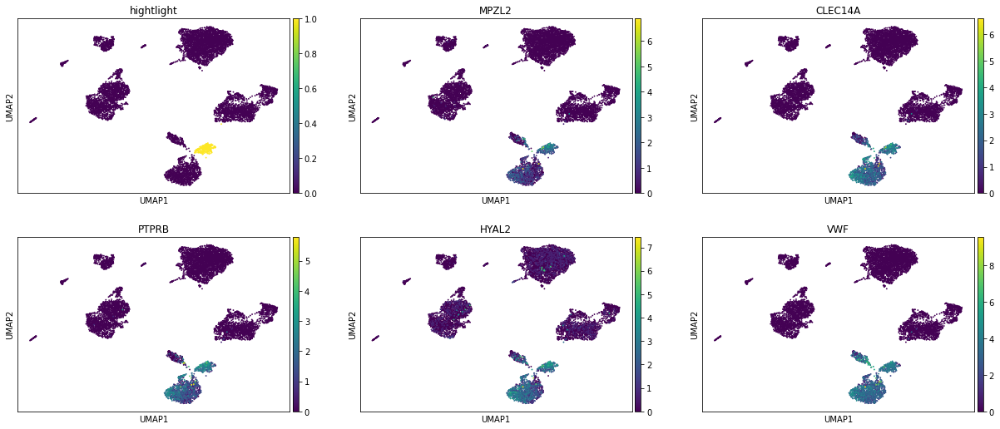

17


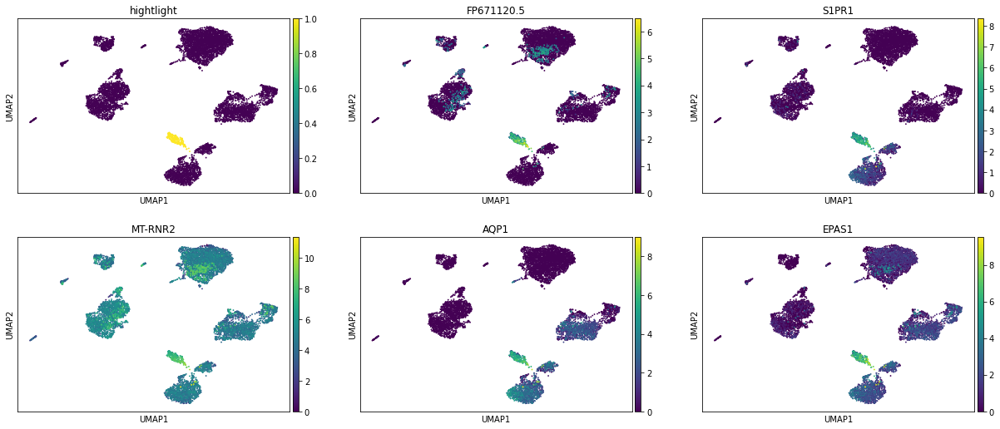

18


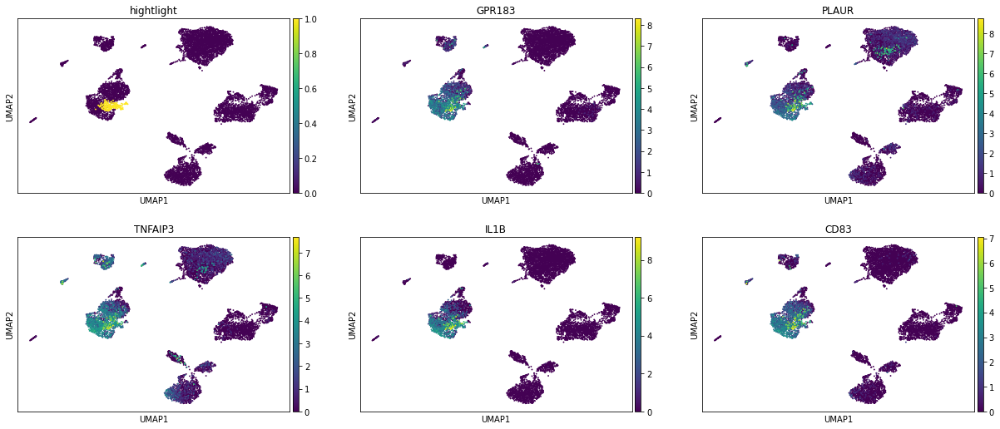

19


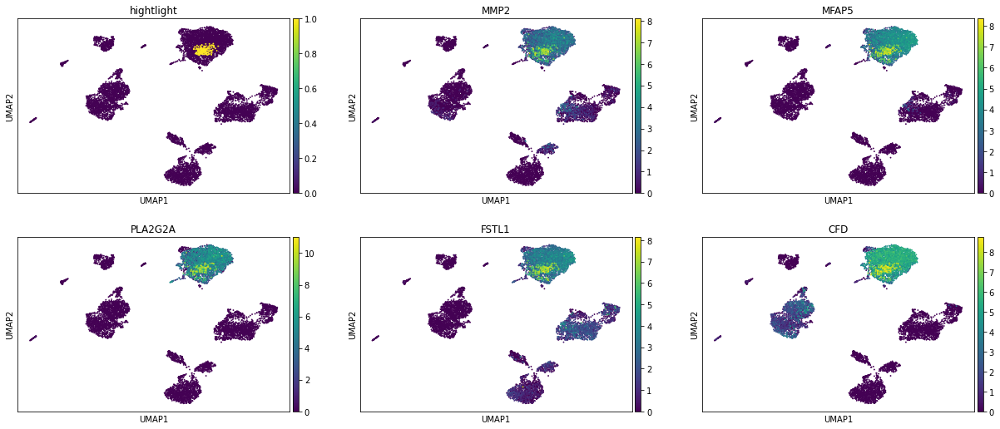

20


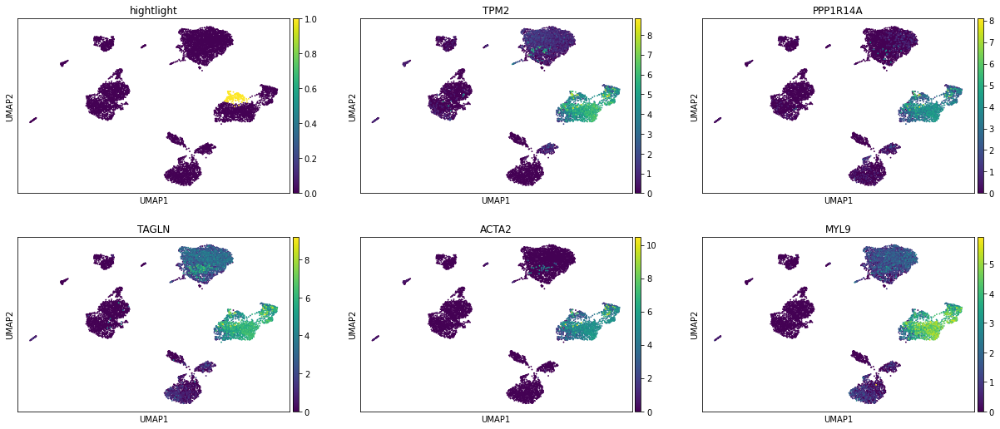

21


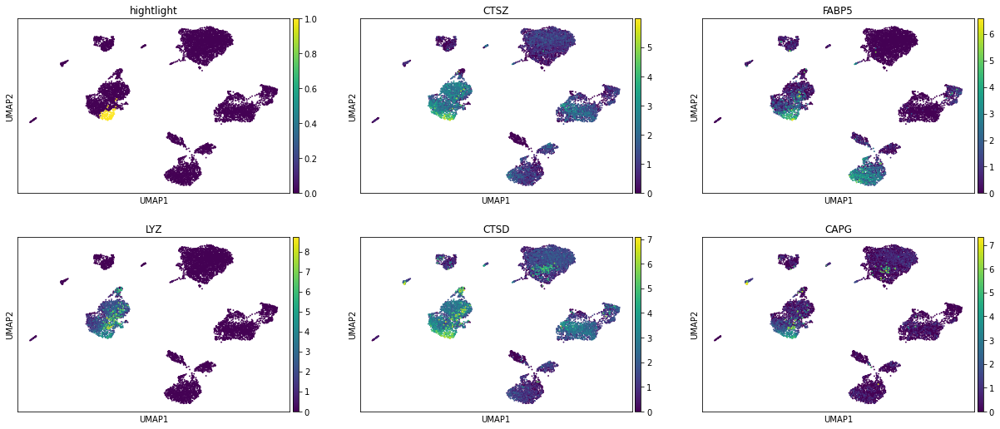

22


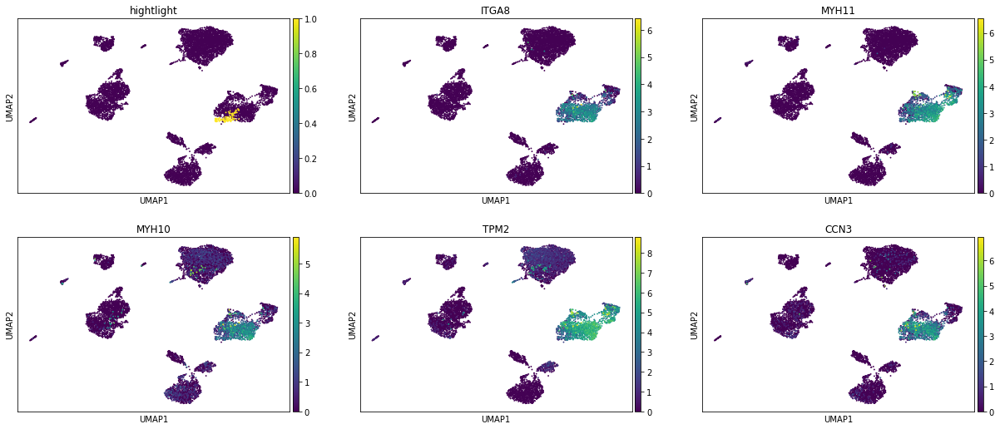

23


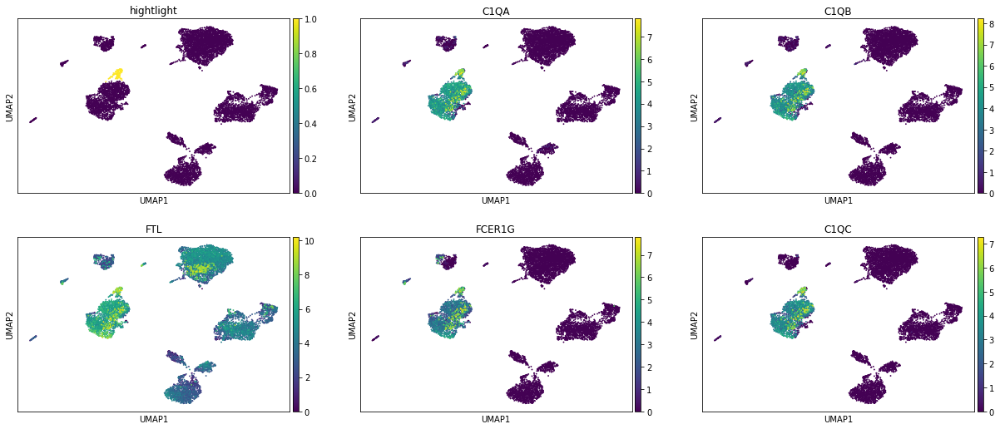

24


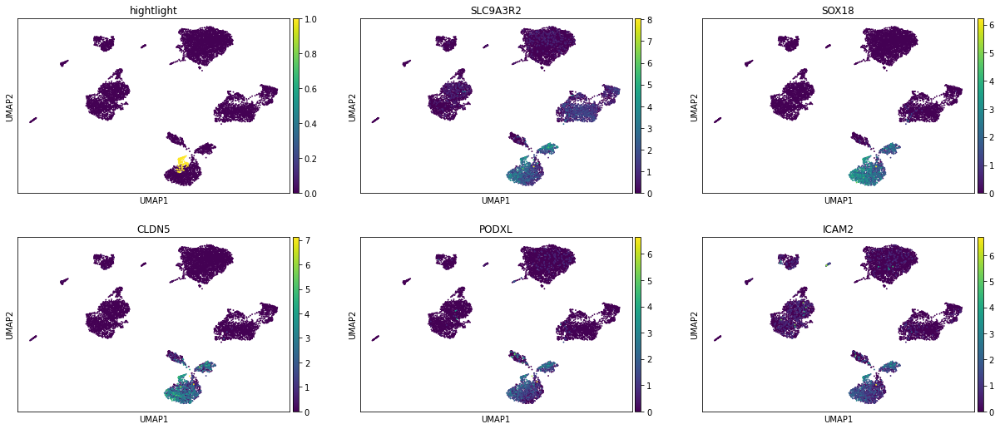

25


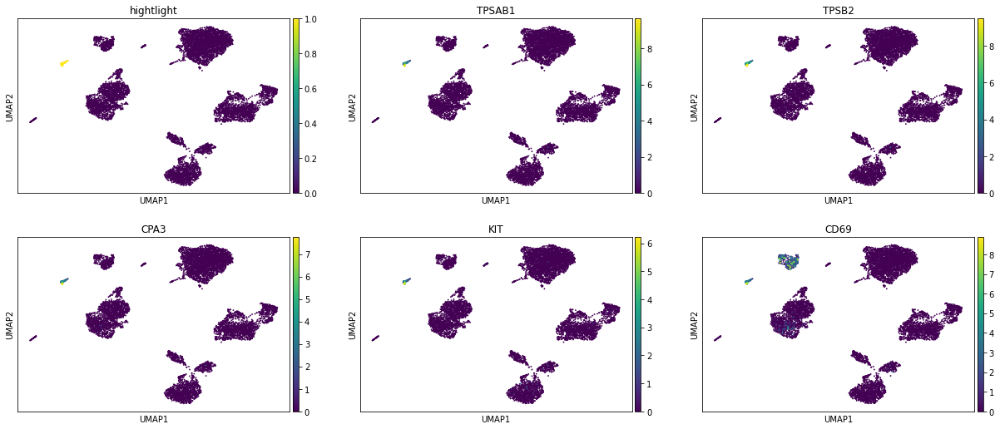

26


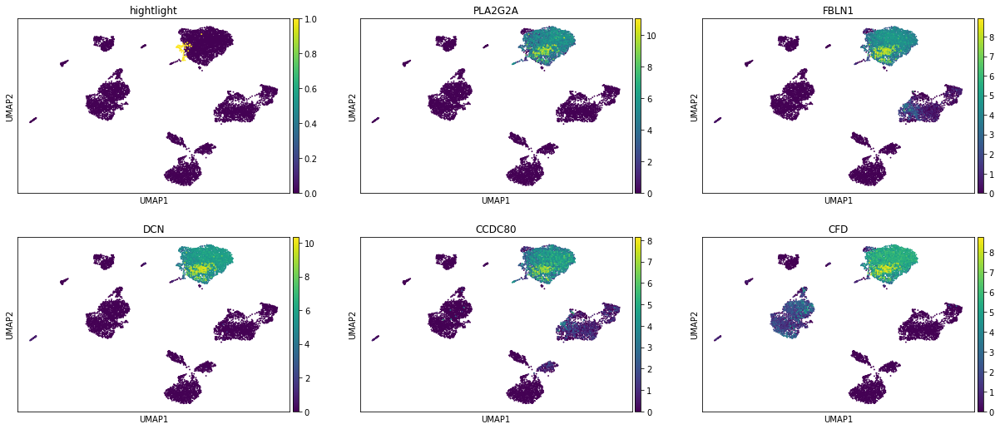

27


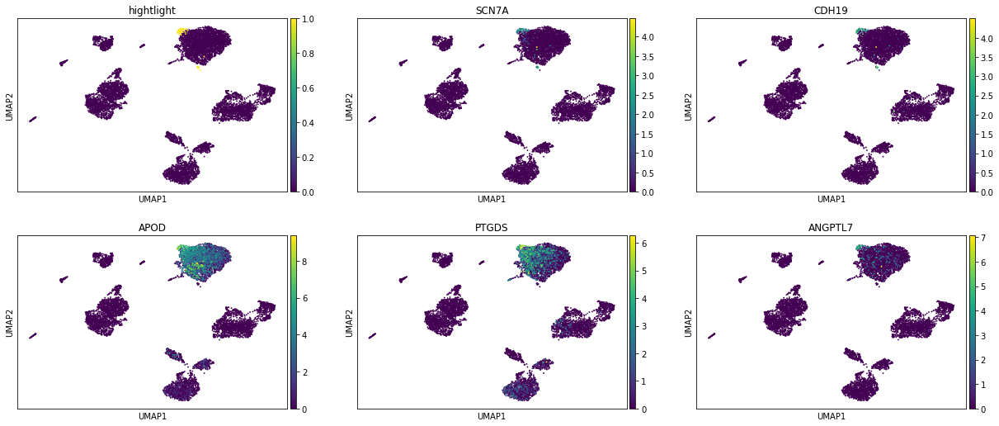

28


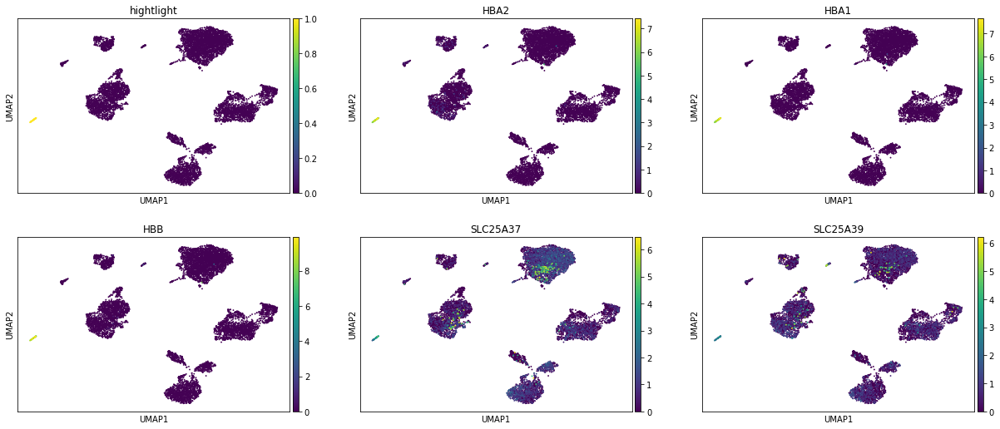

29


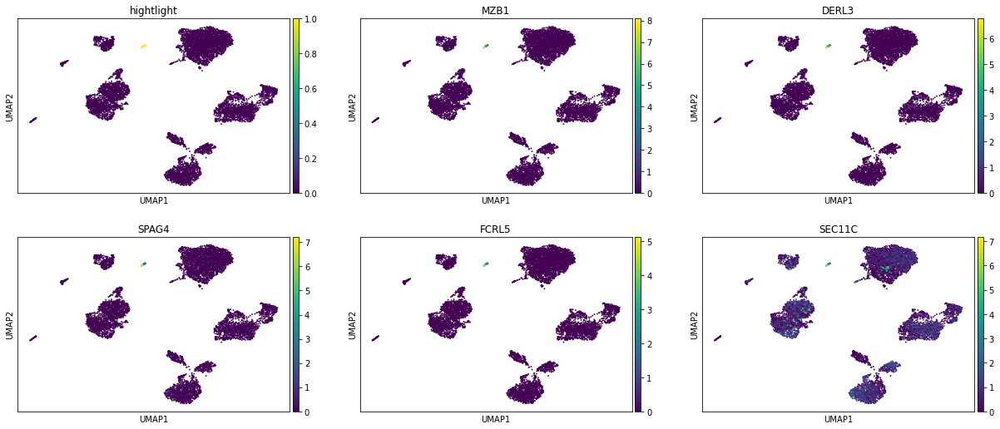

30


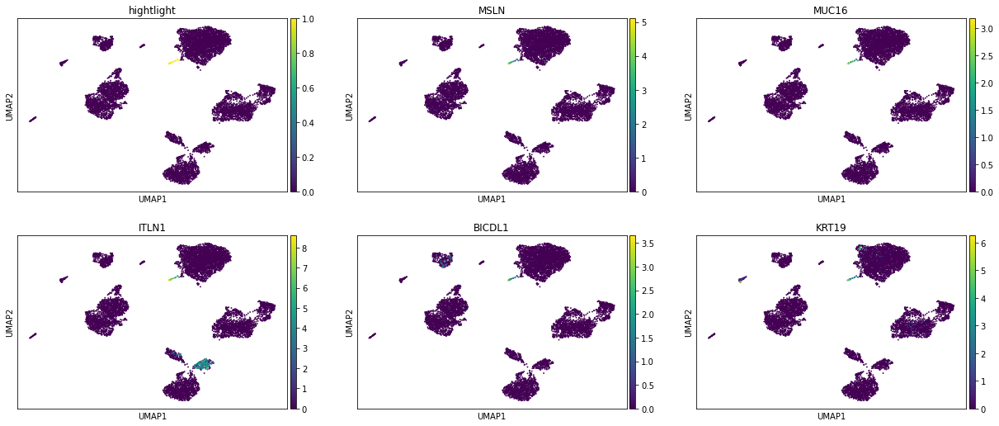

In [28]:
for x in DE.keys():
    print(x)
    topgenes = list(DE[x].T[:5].index)
    organ_adata.obs["hightlight"] = organ_adata.obs["leiden"] == x
    sc.pl.umap(
        organ_adata,
        color=["hightlight"] + topgenes,
        ncols=3,
    )

### The extended DE list can be queried by 

In [29]:
DE["0"].T

,wilcoxon_score,log fold change,adjusted pvalue
RGS5,38.439682,6.819854,0.000000e+00
TPM2,38.407406,7.159810,0.000000e+00
MYL9,38.263199,5.672627,0.000000e+00
PLN,38.185394,6.293163,0.000000e+00
PPP1R14A,38.024776,6.078887,0.000000e+00
...,...,...,...
KLF4,-22.852346,-3.303605,3.809942e-113
HLA-B,-22.999866,-2.037016,1.310716e-114
SELENOP,-25.340223,-5.082963,4.490485e-139
EMP1,-26.529463,-5.324038,1.976963e-152


# read in cell ontology 

In [30]:
import obonet

ont_dir = "/data/yosef2/users/chenling/TabulaSapiensData/ontology/"
obo = ont_dir + "cl.obo.txt"
f = open(obo, "r")
co = obonet.read_obo(f)
f.close()

celltype_dict = {}
for x in co.nodes:
    celltype_dict[co.nodes[x]['name']] = x



You can look up all T cell by typing celltype_dict['T'] and using tab complete  

In [31]:
celltype_dict["T cell"]

'CL:0000084'

You can also look at the names of all subsets of T cell that contains 'CD4' in their names

In [32]:
import networkx as nx


def PrintChildren(co, parent, pattern=""):
    all_children = [x for x in nx.ancestors(co, celltype_dict[parent])]
    return [co.nodes[x]["name"] for x in all_children if pattern in co.nodes[x]["name"]]


PrintChildren(co, "T cell", "CD4")

['CD4-negative, CD8-negative type I NK T cell',
 'CD4-positive, alpha-beta intraepithelial T cell',
 'mature CD4 single-positive thymocyte',
 'CD4-positive, alpha-beta cytotoxic T cell',
 'CD4-positive, alpha-beta thymocyte',
 'activated CD4-positive, alpha-beta T cell',
 'CD4-negative CD8-negative gamma-delta intraepithelial T cell',
 'CD4-negative, CD8-negative type I NK T cell secreting interferon-gamma',
 'CD4-positive type I NK T cell',
 'activated CD4-positive, alpha-beta T cell, human',
 'CD4-positive helper T cell',
 'CD4-positive type I NK T cell secreting interferon-gamma',
 'CD4-positive type I NK T cell secreting interleukin-4',
 'CD4-positive, CD25-positive, CCR4-positive, alpha-beta regulatory T cell',
 'CD4-positive, CD25-positive, alpha-beta regulatory T cell',
 'CD4-positive, CXCR3-negative, CCR6-negative, alpha-beta T cell',
 'effector CD4-positive, alpha-beta T cell',
 'effector memory CD4-positive, alpha-beta T cell',
 'naive thymus-derived CD4-positive, alpha-beta 

# manually create mapping between cluster and cell type (this is just an example), and the relevant marker genes that was used to generate this prediction

In [33]:
organ_adata.obs["annotation_oct2020"] = organ_adata.obs["leiden"].copy()
cluster_mapping = {"0": "T cell"}
cluster_markers = {"0": ["CXCR4", "CD3D", "IL7R", "IL32"]}

This cell will automatically replace the leiden cluster names with cell type annotations

In [34]:
for l in cluster_mapping.keys():
    organ_adata.obs["annotation_oct2020"].replace(l, cluster_mapping[l], inplace=True)
    display(DE[l][cluster_markers[l]])

,CXCR4,CD3D,IL7R,IL32
wilcoxon_score,-5.009133,-1.174956,-0.744271,-4.703532
log fold change,-4.999473,-25.520536,-2.962962,-3.492138
adjusted pvalue,0.000008,1.000000,1.000000,0.000036


# Visualize the results of the manual annotation

/data/yosef2/users/chenling/miniconda3/envs/scvi-tools/lib/python3.8/site-packages/anndata/_core/anndata.py:1192: FutureWarning:

is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead



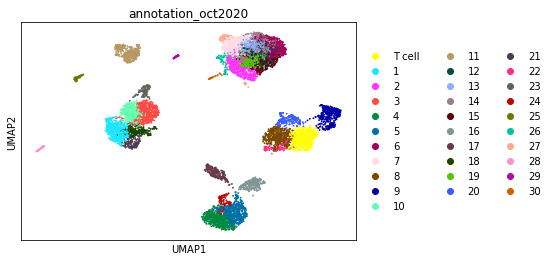

In [35]:
sc.pl.umap(
    organ_adata,
    color=["annotation_oct2020"],
    ncols=3,
)

# create celltype subcluster
This is just an example once the celltype annotations are done, how to subcluster cells in a celltype

/data/yosef2/users/chenling/miniconda3/envs/scvi-tools/lib/python3.8/site-packages/anndata/_core/anndata.py:1094: FutureWarning:

is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead

/data/yosef2/users/chenling/miniconda3/envs/scvi-tools/lib/python3.8/site-packages/anndata/_core/anndata.py:1192: FutureWarning:

is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead



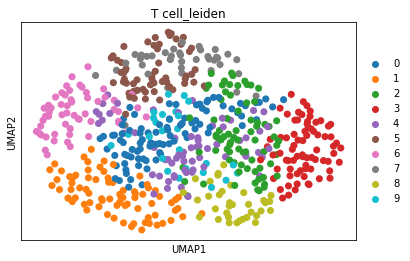

In [36]:
celltype = "T cell"
sub_organ_adata = organ_adata[organ_adata.obs["annotation_oct2020"] == celltype]
sc.pp.neighbors(sub_organ_adata, use_rep="X_scvi_decontX")
sc.tl.umap(
    sub_organ_adata,
)
sc.tl.leiden(sub_organ_adata, resolution=1, key_added="%s_leiden" % celltype)
sc.pl.umap(
    sub_organ_adata,
    color=["%s_leiden" % celltype],
    ncols=3,
)

In [37]:
sc.tl.rank_genes_groups(
    sub_organ_adata, groupby="%s_leiden" % celltype, method="wilcoxon"
)
sub_DE = FormatDE(sub_organ_adata.uns["rank_genes_groups"])

0


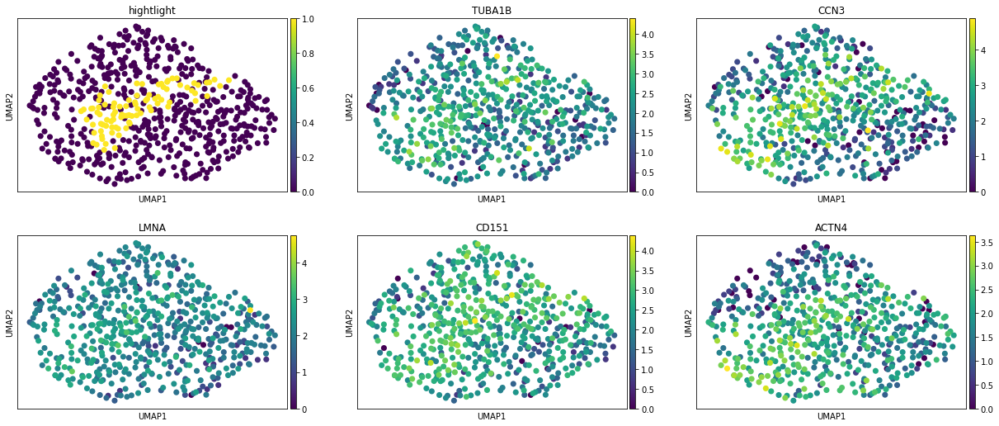

1


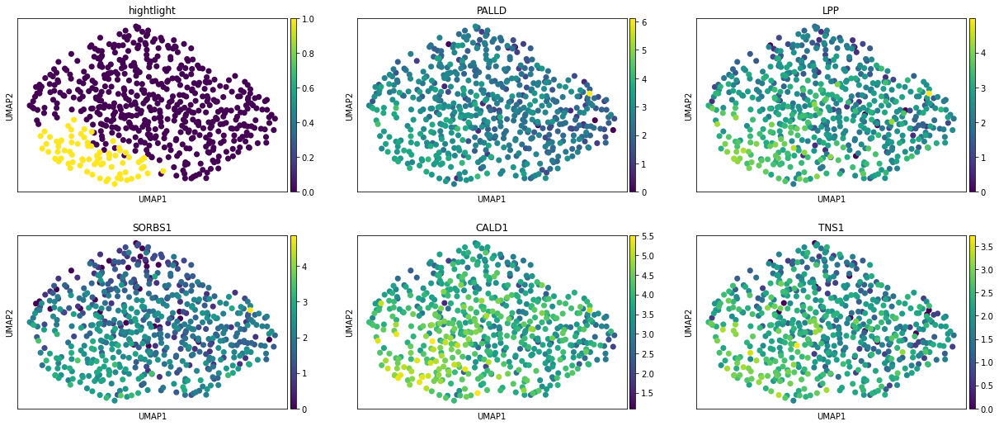

2


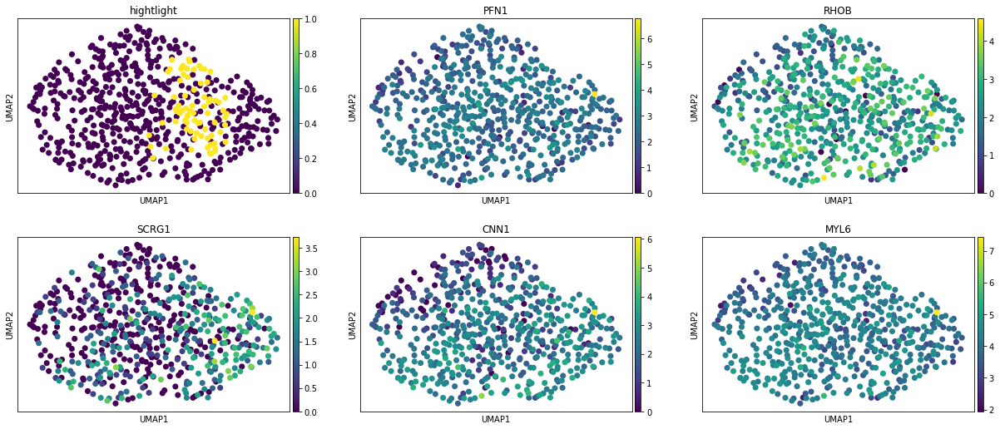

3


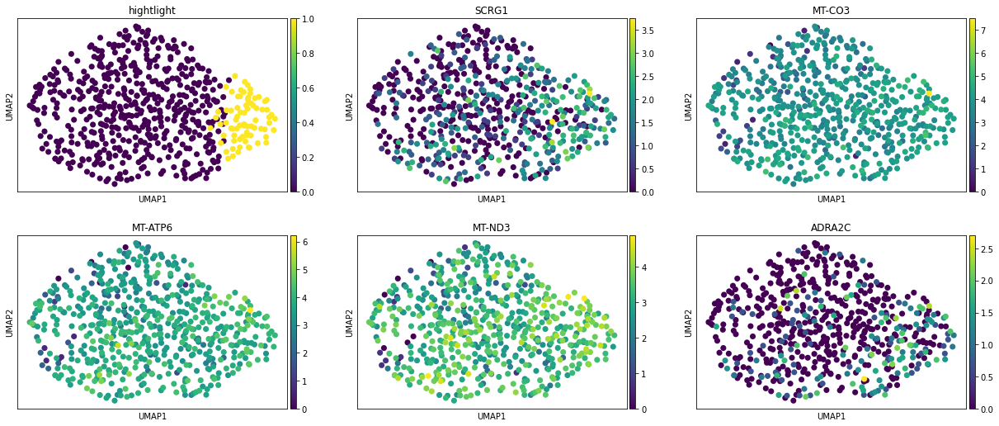

4


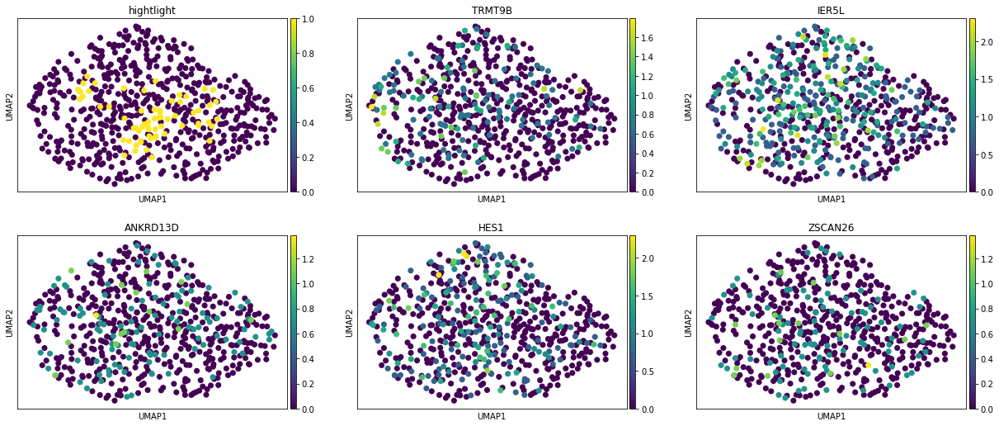

5


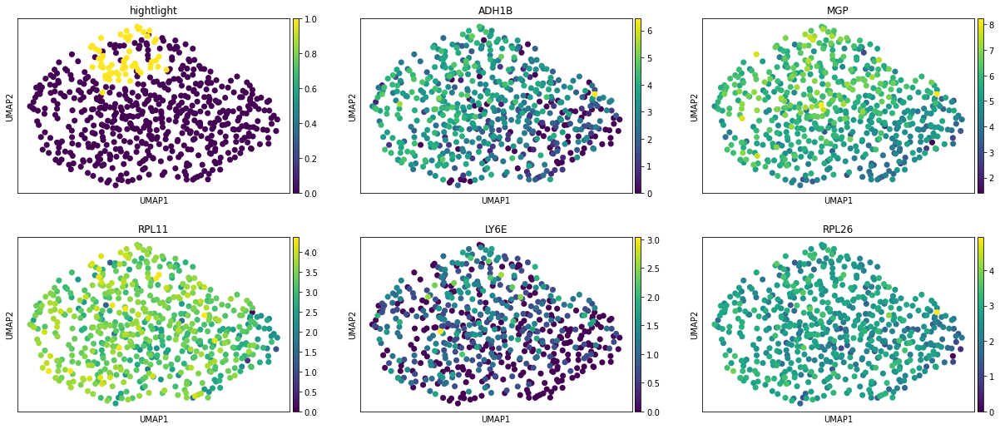

6


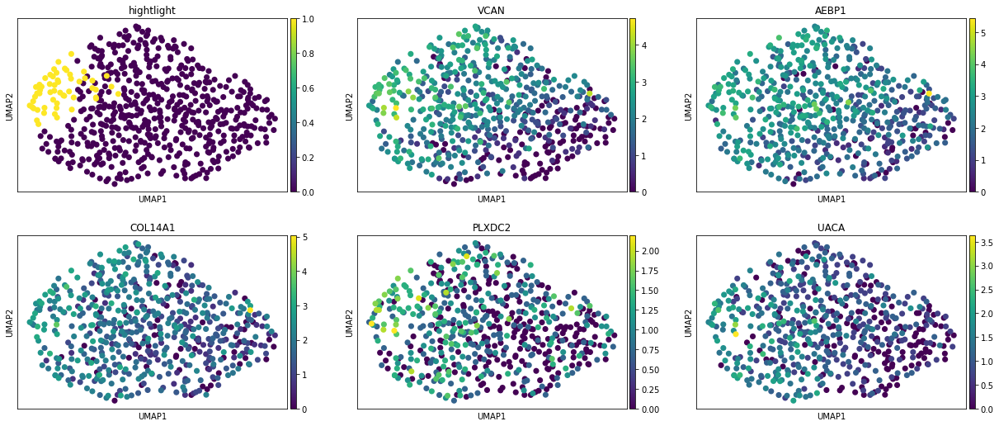

7


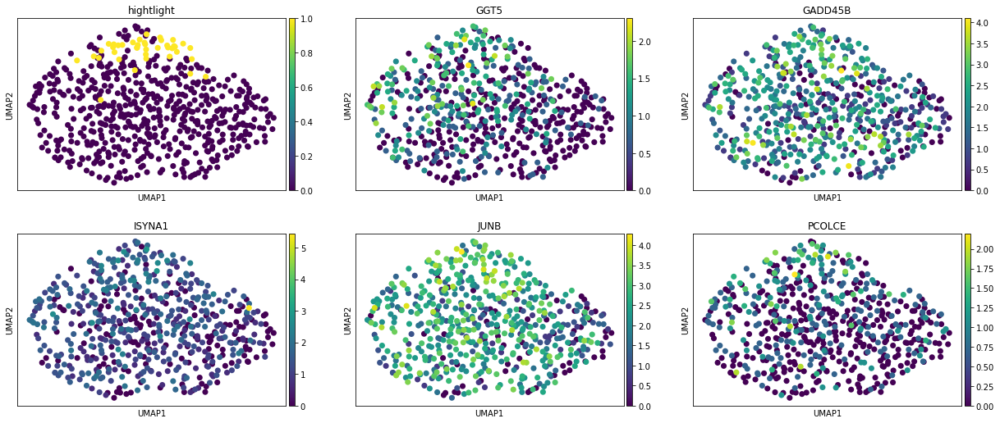

8


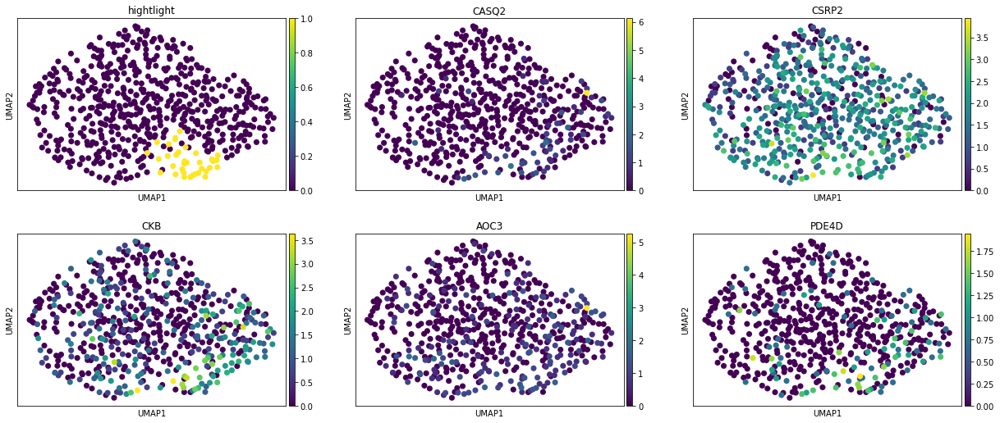

9


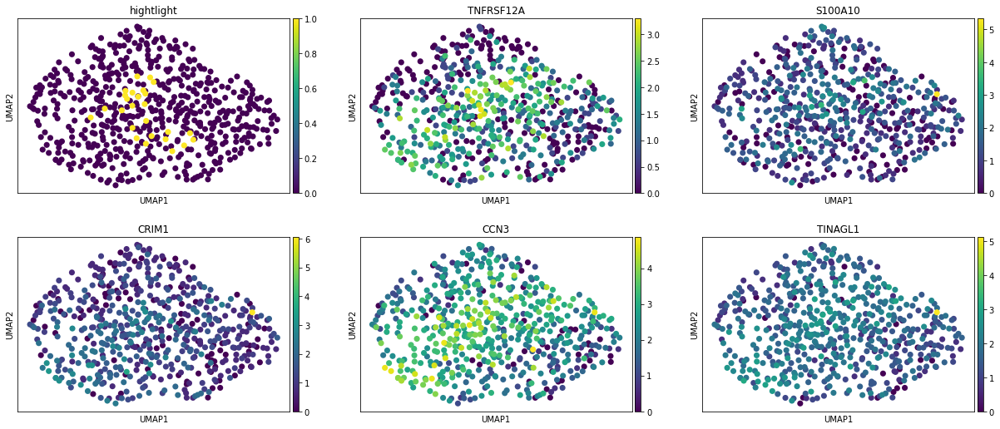

In [38]:
for x in sub_DE.keys():
    print(x)
    topgenes = list(sub_DE[x].T[:5].index)
    sub_organ_adata.obs["hightlight"] = sub_organ_adata.obs["%s_leiden" % celltype] == x
    sc.pl.umap(
        sub_organ_adata,
        color=["hightlight"] + topgenes,
        ncols=3,
    )

# manually create mapping between cell type and compartment (this is just an example)

In [39]:
organ_adata.obs["compartment_oct2020"] = organ_adata.obs["annotation_oct2020"].copy()
compartment_mapping = {"T cell": "Immune"}

This cell will automatically replace the leiden cluster names with cell type annotations

In [40]:
for c in compartment_mapping.keys():
    organ_adata.obs["compartment_oct2020"].replace(
        c, compartment_mapping[c], inplace=True
    )

# Visualize the results of the new compartment splitting

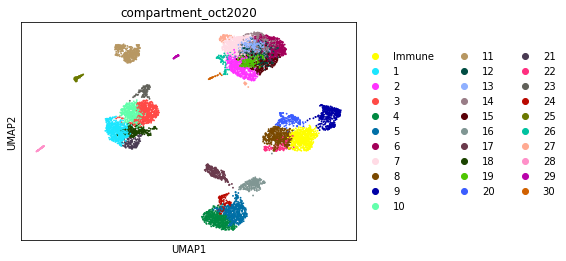

In [41]:
sc.pl.umap(
    organ_adata,
    color=["compartment_oct2020"],
    ncols=3,
)

# save data

In [42]:
organ_adata.write_h5ad(
    data_path + "decontX/organ_data/Pilot1_Pilot2.decontX.%s.h5ad" % organ
)